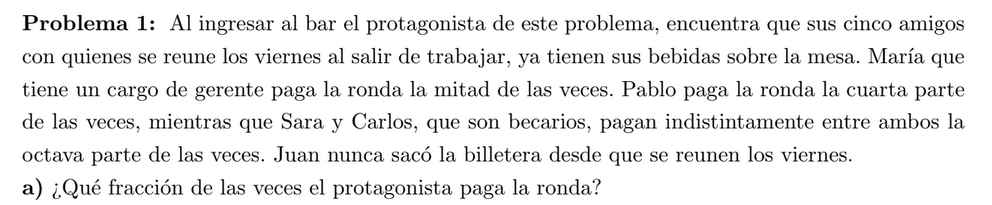

Maria=0.5

Pablo = 0.25

Sara y Carlos = 0.125

Juan = 0

El protagonista debera pagar 1-(0.5+0.25+0.125+0) = 1-0.875 = 0.125 = 1/8 de las veces.


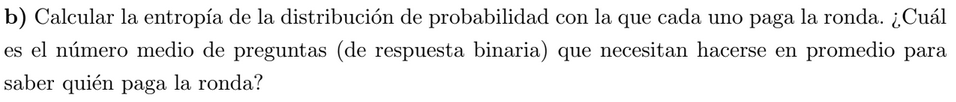

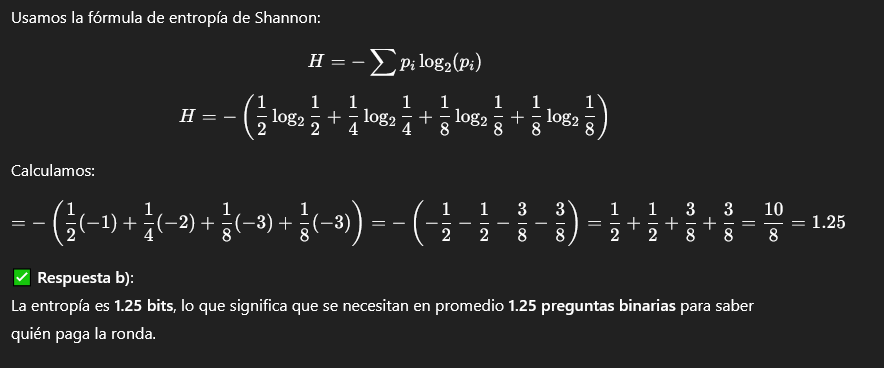

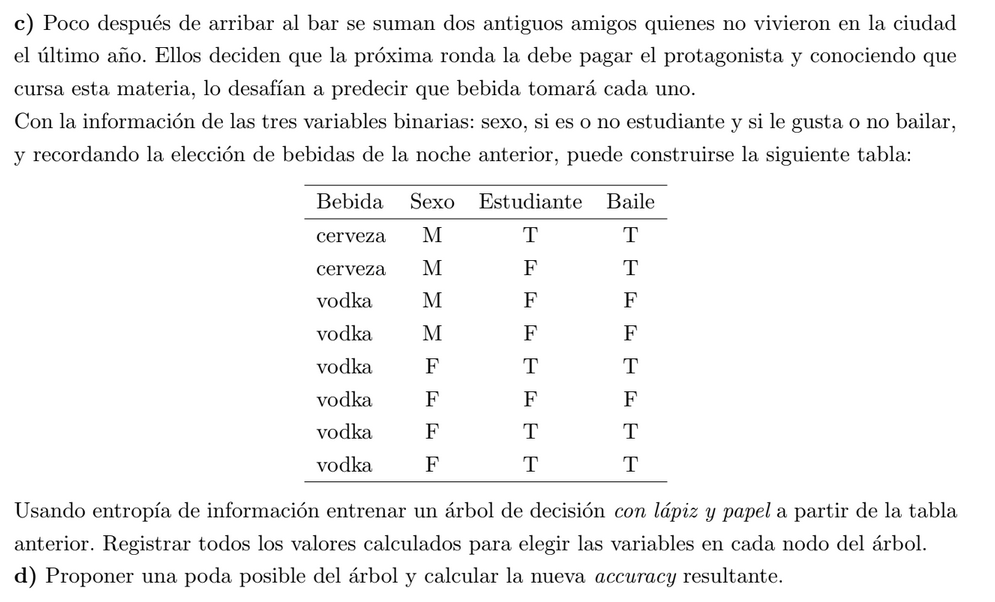

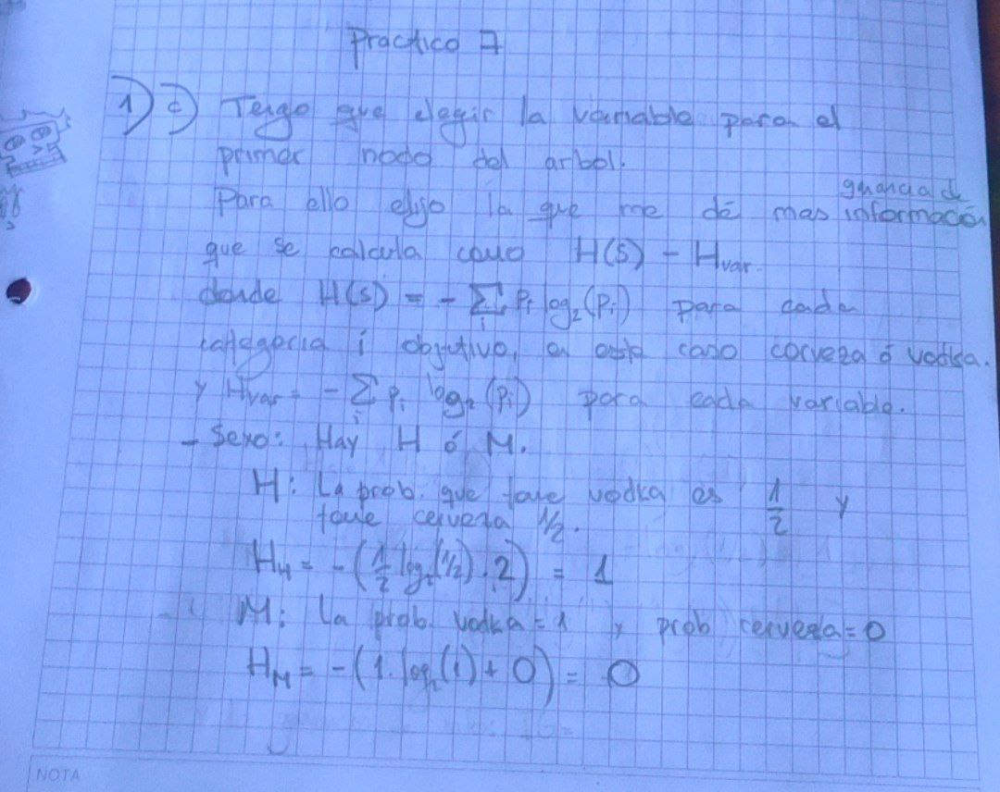

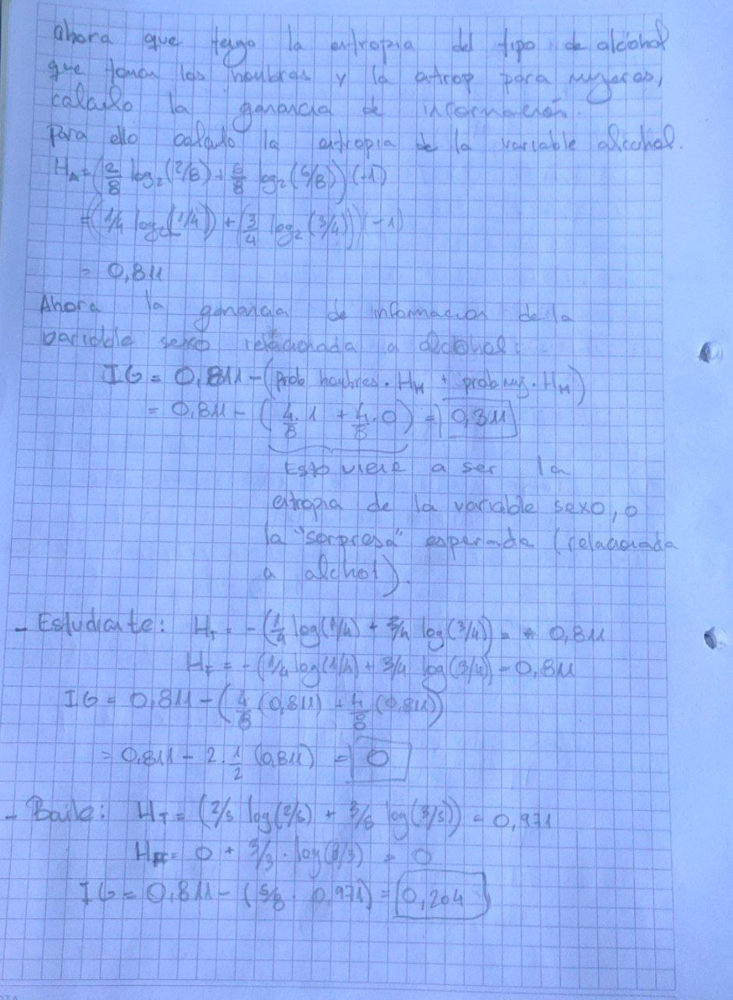

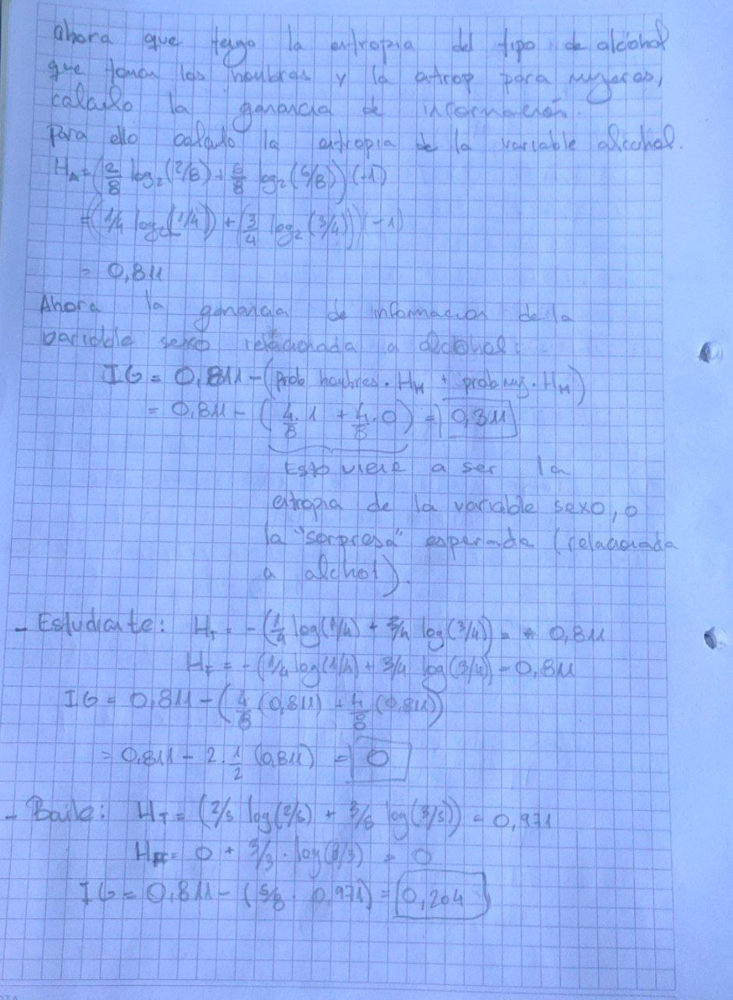

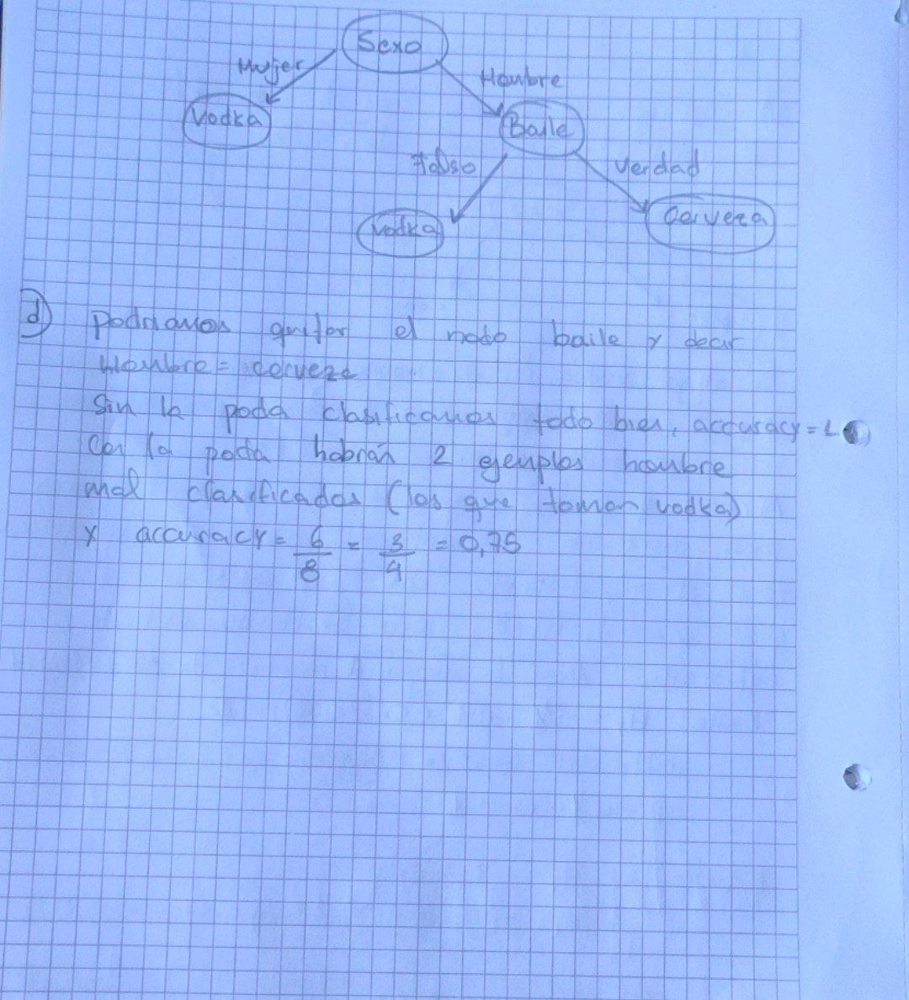

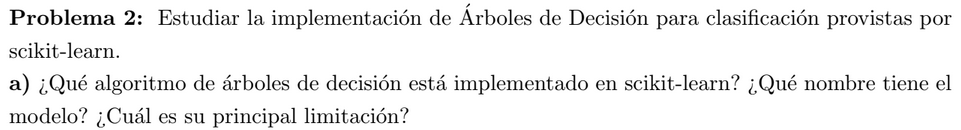


#### Algoritmo implementado

Scikit-learn implementa una **versión optimizada del algoritmo CART** (Classification And Regression Trees), el cual fue introducido por Breiman et al. en 1986.

#### Nombre del modelo

El modelo se llama `DecisionTreeClassifier` (para clasificación) o `DecisionTreeRegressor` (para regresión).

#### Principal limitación

La principal limitación del algoritmo CART en `scikit-learn` es que:

**tiende a sobreajustar (overfitting)** cuando no se controla el tamaño del árbol.

Esto ocurre porque, por defecto, el árbol crece hasta que cada hoja contiene un solo ejemplo (lo que maximiza la precisión en el conjunto de entrenamiento pero generaliza mal).

---

### **b) ¿Cuál opción del parámetro `criterion` se corresponde con la entropía de Shannon y cuál con Gini como medidas de impureza? ¿Qué parámetros controlan el tamaño del árbol y el pruning?**


```python
clf = DecisionTreeClassifier(criterion='entropy')
```

#### Parámetros que controlan el tamaño del árbol (y poda):

1. `max_depth`: profundidad máxima del árbol.
2. `min_samples_split`: mínimo de muestras requeridas para dividir un nodo.
3. `min_samples_leaf`: mínimo de muestras requeridas en una hoja.
4. `max_leaf_nodes`: número máximo de hojas.
5. `ccp_alpha`: valor de **cost-complexity pruning** (poda post-entrenamiento).

* Un `ccp_alpha` mayor poda más nodos (hace el árbol más simple).
* Para usarlo, primero se entrena un árbol completo y luego se poda según este valor.

---


| Pregunta                           | Respuesta                                                              |
| ---------------------------------- | ---------------------------------------------------------------------- |
| Algoritmo usado                    | CART (Classification And Regression Trees)                             |
| Nombre del modelo                  | `DecisionTreeClassifier`                                               |
| Principal limitación               | Overfitting si no se poda/controla                                     |
| `criterion = 'entropy'`            | Usa entropía de Shannon                                                |
| `criterion = 'gini'`               | Usa índice de Gini                                                     |
| Control del tamaño del árbol       | `max_depth`, `min_samples_split`, `min_samples_leaf`, `max_leaf_nodes` |
| Control de poda post-entrenamiento | `ccp_alpha`                                                            |

---

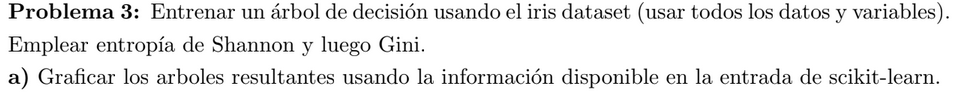

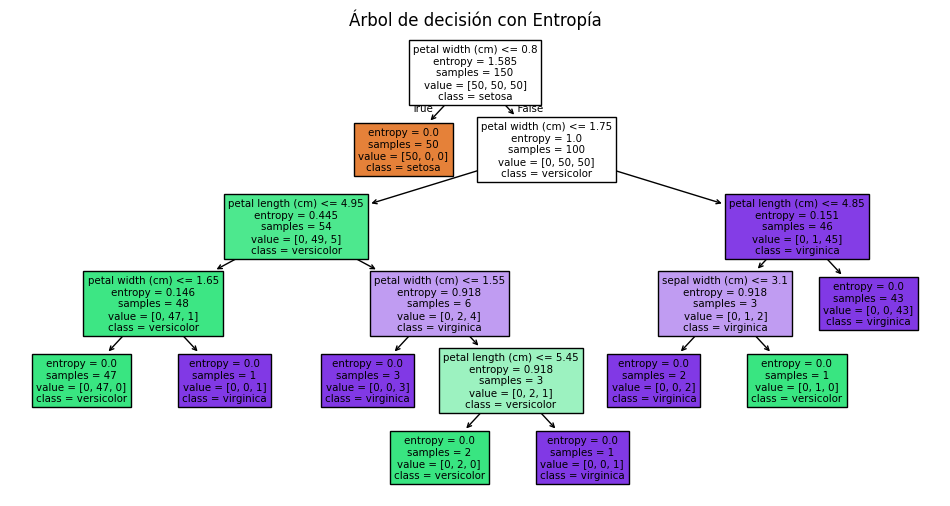

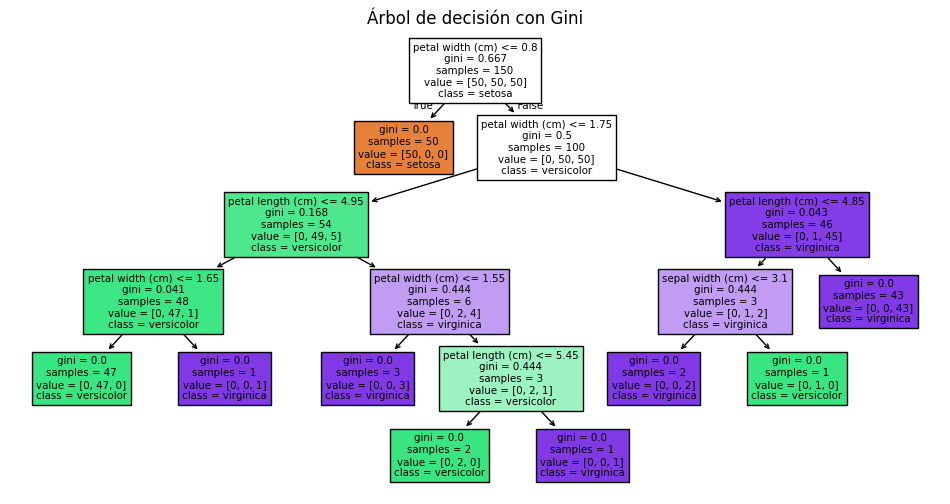

In [ ]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

# 1. Cargar el dataset iris
iris = load_iris()
X = iris.data
y = iris.target

# 2. Entrenar árbol con entropía
clf_entropy = DecisionTreeClassifier(criterion='entropy', random_state=0)
clf_entropy.fit(X, y)

# 3. Entrenar árbol con Gini
clf_gini = DecisionTreeClassifier(criterion='gini', random_state=0)
clf_gini.fit(X, y)

# 4. Graficar el árbol con entropía
plt.figure(figsize=(12, 6))
plot_tree(clf_entropy, filled=True, feature_names=iris.feature_names, class_names=iris.target_names)
plt.title("Árbol de decisión con Entropía")
plt.show()

# 5. Graficar el árbol con Gini
plt.figure(figsize=(12, 6))
plot_tree(clf_gini, filled=True, feature_names=iris.feature_names, class_names=iris.target_names)
plt.title("Árbol de decisión con Gini")
plt.show()

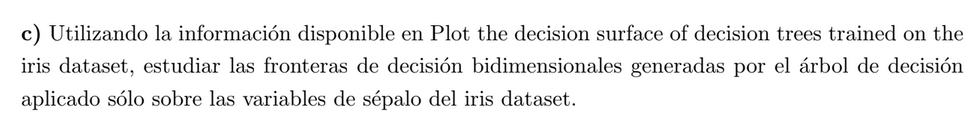

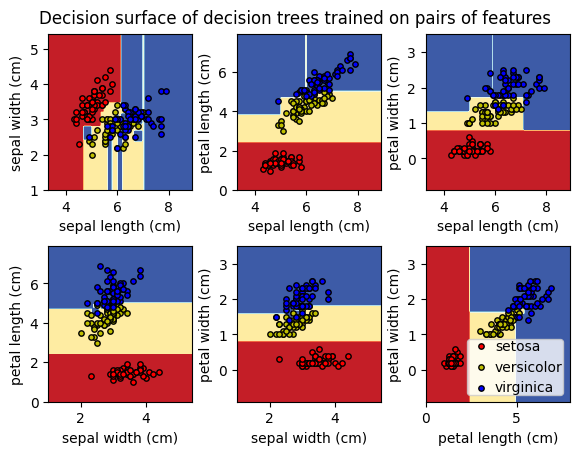

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from sklearn.datasets import load_iris
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.tree import DecisionTreeClassifier

# Parameters
n_classes = 3
plot_colors = "ryb"
plot_step = 0.02


for pairidx, pair in enumerate([[0, 1], [0, 2], [0, 3], [1, 2], [1, 3], [2, 3]]):
    # We only take the two corresponding features
    X = iris.data[:, pair]
    y = iris.target

    # Train
    clf = DecisionTreeClassifier().fit(X, y)

    # Plot the decision boundary
    ax = plt.subplot(2, 3, pairidx + 1)
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)
    DecisionBoundaryDisplay.from_estimator(
        clf,
        X,
        cmap=plt.cm.RdYlBu,
        response_method="predict",
        ax=ax,
        xlabel=iris.feature_names[pair[0]],
        ylabel=iris.feature_names[pair[1]],
    )

    # Plot the training points
    for i, color in zip(range(n_classes), plot_colors):
        idx = np.asarray(y == i).nonzero()
        plt.scatter(
            X[idx, 0],
            X[idx, 1],
            c=color,
            label=iris.target_names[i],
            edgecolor="black",
            s=15,
        )

plt.suptitle("Decision surface of decision trees trained on pairs of features")
plt.legend(loc="lower right", borderpad=0, handletextpad=0)
_ = plt.axis("tight")

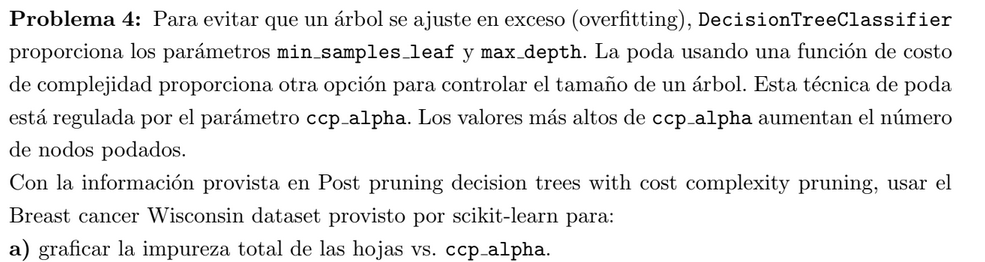

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

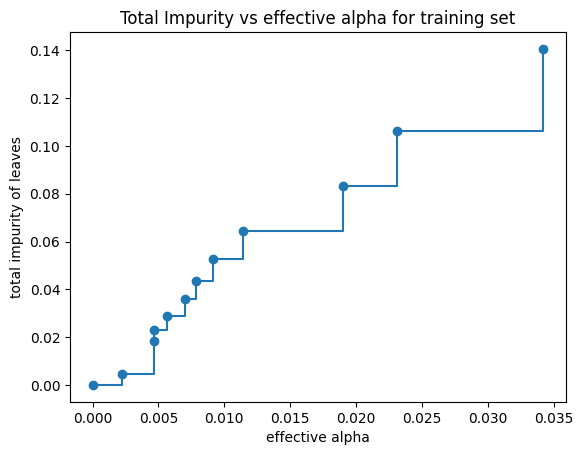

In [ ]:
# Authors: The scikit-learn developers
# SPDX-License-Identifier: BSD-3-Clause

import matplotlib.pyplot as plt

from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

X, y = load_breast_cancer(return_X_y=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

clf = DecisionTreeClassifier(random_state=0)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

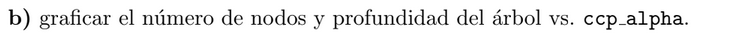

Number of nodes in the last tree is: 1 with ccp_alpha: 0.3272984419327777


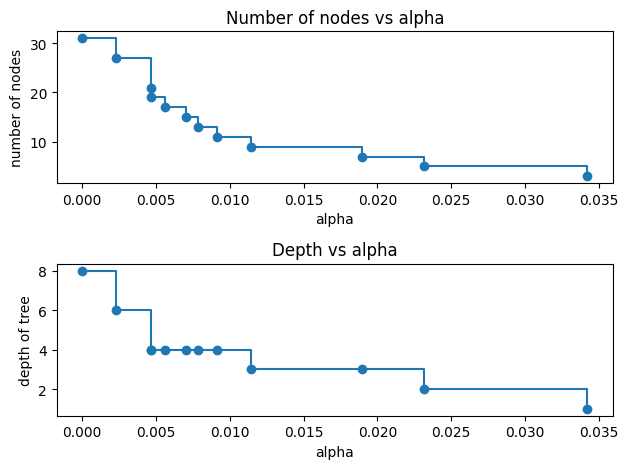

In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

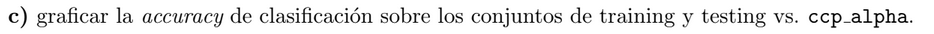

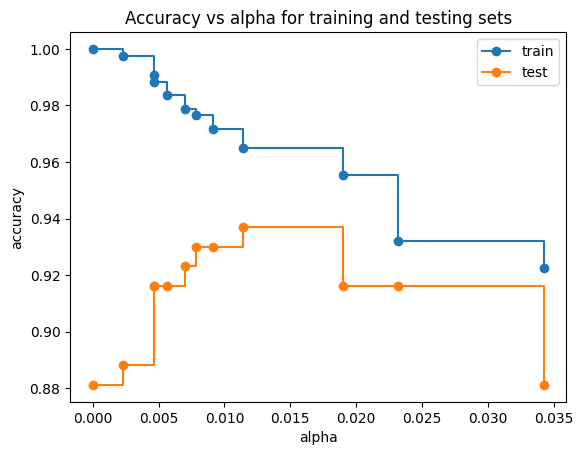

In [ ]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

Vemos que en alpha alrededor de 0.015 se evita el overfitting? Me imagino porque la accuracy en train con un alpha minimo empieza muy alta, pero en test no generaliza, por lo que claramente hay overfitting! A medida que aumentamos el alpha, se podan mas ramas del arbol y empieza a generalizar mejor.

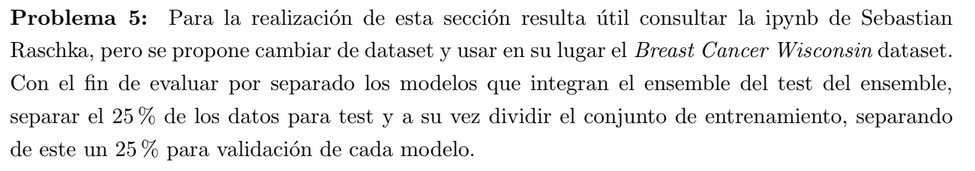

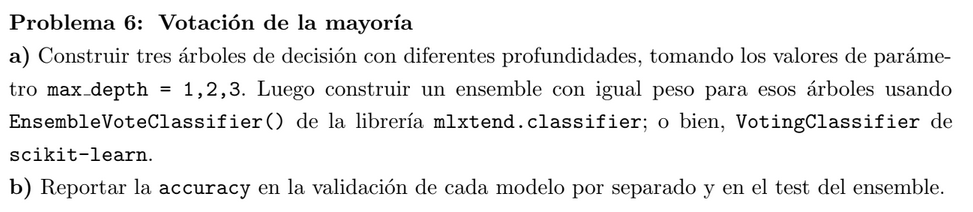

In [ ]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score

# 1. Cargar dataset
data = load_breast_cancer()
X, y = data.data, data.target

# 2. Separar 25% como test, el resto para entrenamiento
X_trainval, X_test, y_trainval, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

# 3. Separar 25% del trainval para validación de los modelos base
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.25, random_state=0)

# 4. Crear los modelos con distintas profundidades
tree1 = DecisionTreeClassifier(max_depth=1, random_state=0)
tree2 = DecisionTreeClassifier(max_depth=2, random_state=0)
tree3 = DecisionTreeClassifier(max_depth=3, random_state=0)

# 5. Entrenar los modelos individualmente
tree1.fit(X_train, y_train)
tree2.fit(X_train, y_train)
tree3.fit(X_train, y_train)

# 6. Evaluar en validación
acc1 = accuracy_score(y_val, tree1.predict(X_val))
acc2 = accuracy_score(y_val, tree2.predict(X_val))
acc3 = accuracy_score(y_val, tree3.predict(X_val))

print("Accuracy individual en validación:")
print(f"Árbol profundidad 1: {acc1:.3f}")
print(f"Árbol profundidad 2: {acc2:.3f}")
print(f"Árbol profundidad 3: {acc3:.3f}")

# 7. Construir ensemble por mayoría
ensemble = VotingClassifier(estimators=[
    ('tree1', tree1), ('tree2', tree2), ('tree3', tree3)
], voting='hard') #hard es por clase mayoritaria

ensemble.fit(X_train, y_train)

# 8. Evaluar ensemble en conjunto de test
ensemble_acc = accuracy_score(y_test, ensemble.predict(X_test))
print(f"\nAccuracy del ensemble sobre test: {ensemble_acc:.3f}")


Accuracy individual en validación:
Árbol profundidad 1: 0.897
Árbol profundidad 2: 0.888
Árbol profundidad 3: 0.888

Accuracy del ensemble sobre test: 0.951


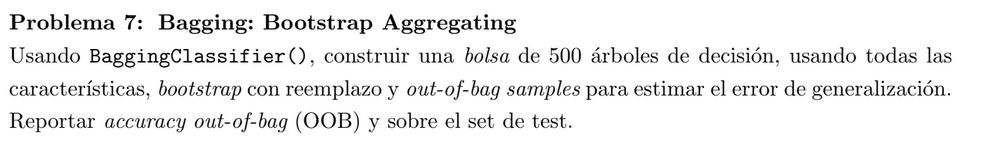

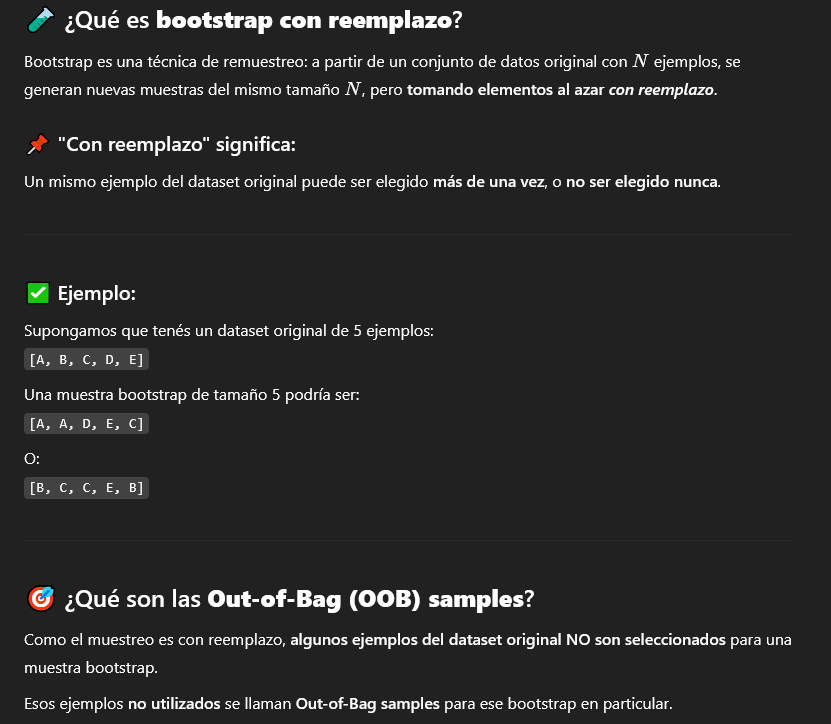

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# 1. Cargar dataset
data = load_breast_cancer()
X, y = data.data, data.target

# 2. Separar test (25%) y entrenamiento (75%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

# 3. Crear clasificador base (árbol)
base_tree = DecisionTreeClassifier()

# 4. Construir el modelo Bagging con 500 árboles, OOB habilitado
bagging = BaggingClassifier(
    estimator=base_tree,
    n_estimators=500,
    bootstrap=True,
    oob_score=True,
    random_state=0,
    n_jobs=-1  # Usa todos los núcleos para acelerar
)

# 5. Entrenar el modelo
bagging.fit(X_train, y_train)

# 6. Accuracy OOB
oob_acc = bagging.oob_score_
print(f"Accuracy OOB: {oob_acc:.3f}")

# 7. Accuracy en test
test_acc = accuracy_score(y_test, bagging.predict(X_test))
print(f"Accuracy en test: {test_acc:.3f}")


Accuracy OOB: 0.948
Accuracy en test: 0.972


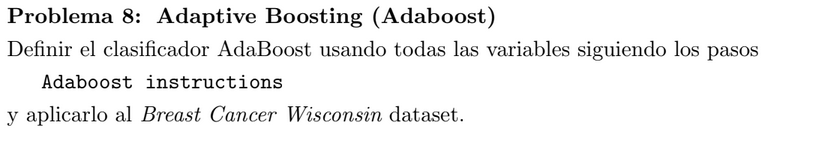

In [ ]:
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.datasets import load_breast_cancer

class AdaBoost:
    def __init__(self, n_estimators=50):
        self.n_estimators = n_estimators
        self.alphas = []
        self.models = []

    def fit(self, X, y):
        n_samples, n_features = X.shape
        w = np.ones(n_samples) / n_samples

        for _ in range(self.n_estimators):
            model = DecisionTreeClassifier(max_depth=1)
            model.fit(X, y, sample_weight=w)
            predictions = model.predict(X)

            err = np.sum(w * (predictions != y)) / np.sum(w)

            alpha = 0.5 * np.log((1 - err) / (err + 1e-10))

            self.models.append(model)
            self.alphas.append(alpha)

            w *= np.exp(-alpha * y * predictions)
            w /= np.sum(w)

    def predict(self, X):
            strong_preds = np.zeros(X.shape[0])

            for model, alpha in zip(self.models, self.alphas):
                predictions = model.predict(X)
                strong_preds += alpha * predictions

            return np.sign(strong_preds).astype(int)

if __name__ == "__main__":

    # 1. Cargar el dataset
    data = load_breast_cancer()
    X, y = data.data, data.target

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    adaboost = AdaBoost(n_estimators=50)
    adaboost.fit(X_train, y_train)

    predictions = adaboost.predict(X_test)

    accuracy = accuracy_score(y_test, predictions)
    precision = precision_score(y_test, predictions)
    recall = recall_score(y_test, predictions)
    f1 = f1_score(y_test, predictions)
    try:
        roc_auc = roc_auc_score(y_test, predictions)
    except ValueError:
        roc_auc = 'Undefined (requires probability scores)'

    print(f"Accuracy: {accuracy * 100}%")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")
    print(f"ROC-AUC: {roc_auc}")

Accuracy: 93.56725146198829%
Precision: 0.9292035398230089
Recall: 0.9722222222222222
F1 Score: 0.9502262443438914
ROC-AUC: 0.9226190476190477


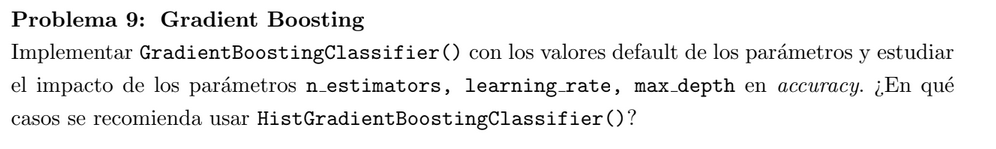

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# 1. Cargar dataset
data = load_breast_cancer()
X, y = data.data, data.target

# 2. Dividir en entrenamiento y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

# 3. Entrenar con parámetros por defecto
gb_default = GradientBoostingClassifier(random_state=0)
gb_default.fit(X_train, y_train)

# 4. Accuracy
train_acc = accuracy_score(y_train, gb_default.predict(X_train))
test_acc = accuracy_score(y_test, gb_default.predict(X_test))

print(f"Accuracy en entrenamiento: {train_acc:.3f}")
print(f"Accuracy en test: {test_acc:.3f}")


Accuracy en entrenamiento: 1.000
Accuracy en test: 0.965


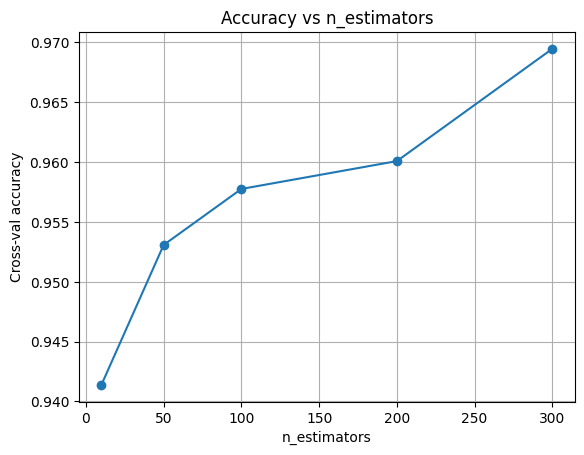

In [ ]:
from sklearn.model_selection import cross_val_score
import numpy as np

# Evaluar n_estimators
estimators = [10, 50, 100, 200, 300]
scores = []

for n in estimators:
    model = GradientBoostingClassifier(n_estimators=n, random_state=0)
    score = cross_val_score(model, X_train, y_train, cv=5).mean()
    scores.append(score)

plt.plot(estimators, scores, marker='o')
plt.title("Accuracy vs n_estimators")
plt.xlabel("n_estimators")
plt.ylabel("Cross-val accuracy")
plt.grid(True)
plt.show()


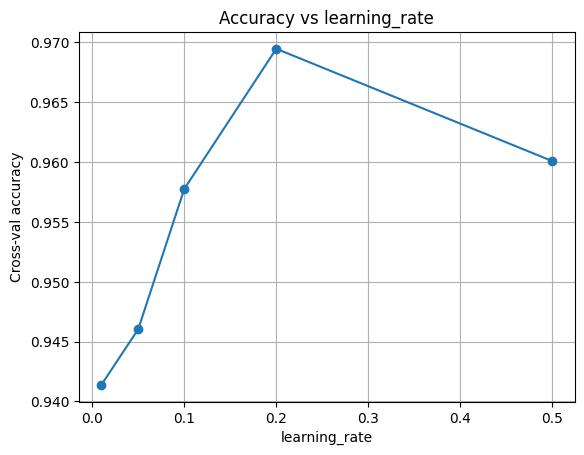

In [ ]:
# Ejemplo para learning_rate
rates = [0.01, 0.05, 0.1, 0.2, 0.5]
scores = []

for lr in rates:
    model = GradientBoostingClassifier(learning_rate=lr, random_state=0)
    score = cross_val_score(model, X_train, y_train, cv=5).mean()
    scores.append(score)

plt.plot(rates, scores, marker='o')
plt.title("Accuracy vs learning_rate")
plt.xlabel("learning_rate")
plt.ylabel("Cross-val accuracy")
plt.grid(True)
plt.show()


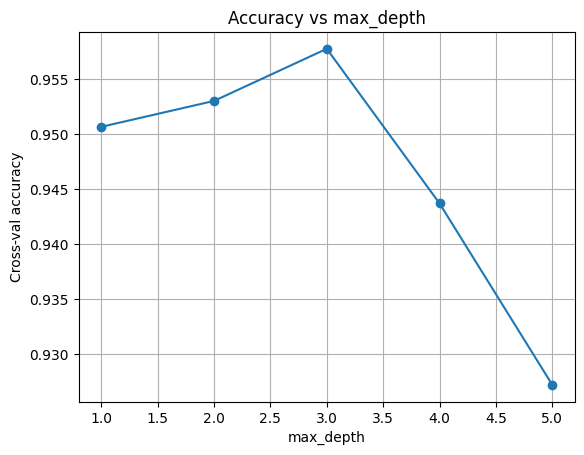

In [ ]:
# Ejemplo para max depth
depth = [1, 2, 3, 4, 5]
scores = []

for lr in depth:
    model = GradientBoostingClassifier(max_depth=lr, random_state=0)
    score = cross_val_score(model, X_train, y_train, cv=5).mean()
    scores.append(score)

plt.plot(depth, scores, marker='o')
plt.title("Accuracy vs max_depth")
plt.xlabel("max_depth")
plt.ylabel("Cross-val accuracy")
plt.grid(True)
plt.show()


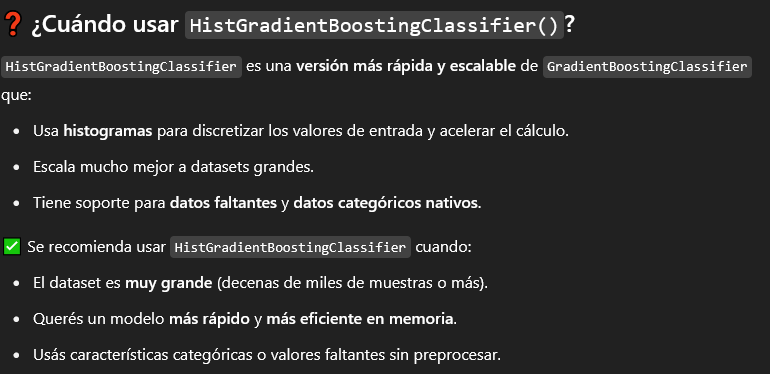

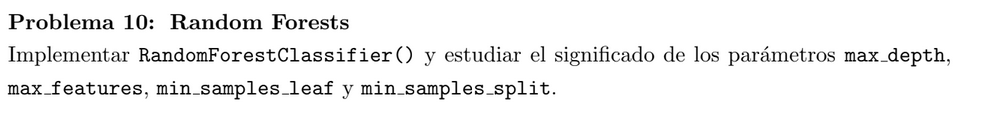

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# 1. Cargar el dataset
data = load_breast_cancer()
X, y = data.data, data.target

# 2. Separar en train y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

# 3. Entrenar Random Forest con parámetros por defecto
rf = RandomForestClassifier(random_state=0)
rf.fit(X_train, y_train)

# 4. Evaluar accuracy
train_acc = accuracy_score(y_train, rf.predict(X_train))
test_acc = accuracy_score(y_test, rf.predict(X_test))

print(f"Accuracy en entrenamiento: {train_acc:.3f}")
print(f"Accuracy en test: {test_acc:.3f}")


Accuracy en entrenamiento: 1.000
Accuracy en test: 0.972


In [ ]:
for max_depth in [3, 5, 10, None]:
    for min_samples_leaf in [1, 5, 10]:
        model = RandomForestClassifier(
            max_depth=max_depth,
            min_samples_leaf=min_samples_leaf,
            random_state=0
        )
        model.fit(X_train, y_train)
        acc = accuracy_score(y_test, model.predict(X_test))
        print(f"max_depth={max_depth}, min_samples_leaf={min_samples_leaf} → accuracy: {acc:.3f}")


max_depth=3, min_samples_leaf=1 → accuracy: 0.958
max_depth=3, min_samples_leaf=5 → accuracy: 0.965
max_depth=3, min_samples_leaf=10 → accuracy: 0.965
max_depth=5, min_samples_leaf=1 → accuracy: 0.972
max_depth=5, min_samples_leaf=5 → accuracy: 0.965
max_depth=5, min_samples_leaf=10 → accuracy: 0.965
max_depth=10, min_samples_leaf=1 → accuracy: 0.972
max_depth=10, min_samples_leaf=5 → accuracy: 0.972
max_depth=10, min_samples_leaf=10 → accuracy: 0.965
max_depth=None, min_samples_leaf=1 → accuracy: 0.972
max_depth=None, min_samples_leaf=5 → accuracy: 0.972
max_depth=None, min_samples_leaf=10 → accuracy: 0.965


| Parámetro           | Qué controla                           | Cómo afecta el modelo                                  |
| ------------------- | -------------------------------------- | ------------------------------------------------------ |
| `max_depth`         | Profundidad máxima de los árboles      | Más profundidad → más ajuste (cuidado con overfitting) |
| `max_features`      | Cuántas variables considerar por split | Menos features → más diversidad entre árboles          |
| `min_samples_leaf`  | Tamaño mínimo de hoja                  | Hojas más grandes → regularización                     |
| `min_samples_split` | Muestras mínimas para dividir          | Controla cuándo se hace una división                   |

